In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import cv2
import os
import warnings
from tqdm import tqdm

In [3]:
from skimage.feature import local_binary_pattern, graycomatrix, graycoprops
from skimage.measure import regionprops, label as sk_label
from skimage.morphology import opening, closing, disk
from skimage.filters import threshold_otsu
from skimage.segmentation import watershed, clear_border


In [4]:

from sklearn.preprocessing import LabelEncoder


In [5]:
#### Chargement des données

BASE_DIR = "/Users/agshayn/Desktop/cours/2A/IMA/4IM05/projet_kaggle/wbc-classification/data/raw/IMA205-challenge 2"  # Racine de votre dataset
TRAIN_DIR = os.path.join(BASE_DIR, "Train")
TEST_DIR = os.path.join(BASE_DIR, "Test")
TRAIN_CSV = os.path.join(BASE_DIR, "train_metadata.csv")
TEST_CSV = os.path.join(BASE_DIR, "test_metadata.csv")
SAMPLE_SUB = os.path.join(BASE_DIR, "sample_submission.csv")

train_df = pd.read_csv(TRAIN_CSV)
test_df = pd.read_csv(TEST_CSV)

print(f"Train metadata shape : {train_df.shape}")
print(f"Test metadata shape  : {test_df.shape}")
print(f"\nColonnes train : {train_df.columns.tolist()}")
print(f"\nDistribution des classes :\n{train_df.iloc[:, 1].value_counts()}")
print(f"\nNombre de classes : {train_df.iloc[:, 1].nunique()}")

### Identification
id_col = train_df.columns[0]
label_col = train_df.columns[1]
print(f"Colonne ID    : '{id_col}'")
print(f"Colonne Label : '{label_col}'")

# Encoder les labels
le = LabelEncoder()
train_df['label_encoded'] = le.fit_transform(train_df[label_col])
class_names = le.classes_
print(f"\nClasses : {class_names}")
print(id_col)

Train metadata shape : (28901, 2)
Test metadata shape  : (9634, 1)

Colonnes train : ['ID', 'label']

Distribution des classes :
label
SNE    13015
LY      8101
MO      2746
BL      2012
EO       861
MY       441
BA       415
BNE      391
VLY      366
MMY      360
PMY      114
PC        68
PLY       11
Name: count, dtype: int64

Nombre de classes : 13
Colonne ID    : 'ID'
Colonne Label : 'label'

Classes : ['BA' 'BL' 'BNE' 'EO' 'LY' 'MMY' 'MO' 'MY' 'PC' 'PLY' 'PMY' 'SNE' 'VLY']
ID


Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
Corrupt JPEG data: 27 extraneous bytes before marker 0xdb


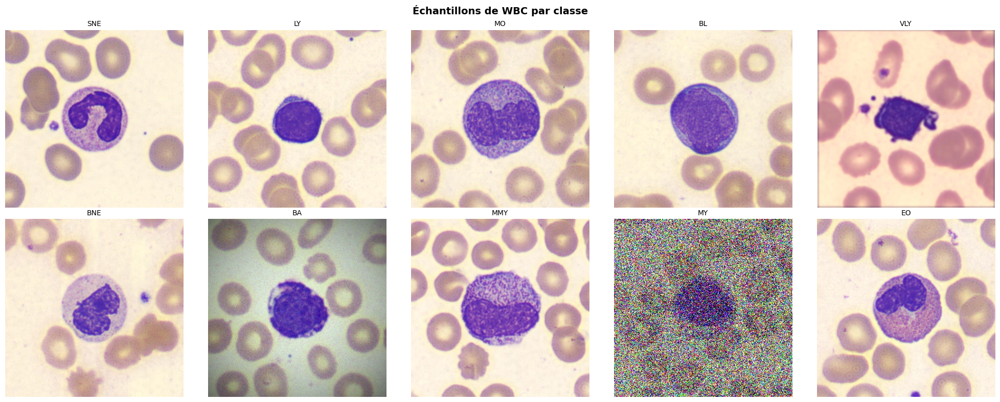

In [6]:
# %% [markdown]
# ## 3. Visualisation d'Échantillons

# %%
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.ravel()

# Afficher des exemples de différentes classes
unique_labels = train_df[label_col].unique()[:10]
for i, lbl in enumerate(unique_labels):
    if i >= 10:
        break
    sample = train_df[train_df[label_col] == lbl].iloc[0]
    img_path = os.path.join(TRAIN_DIR, f"{sample[id_col]}")
    if os.path.exists(img_path):
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img)
        axes[i].set_title(f"{lbl}", fontsize=10)
    axes[i].axis('off')

plt.suptitle("Échantillons de WBC par classe", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

def load_image(path):
    img = cv2.imread(path)
    return img

Corrupt JPEG data: 27 extraneous bytes before marker 0xdb


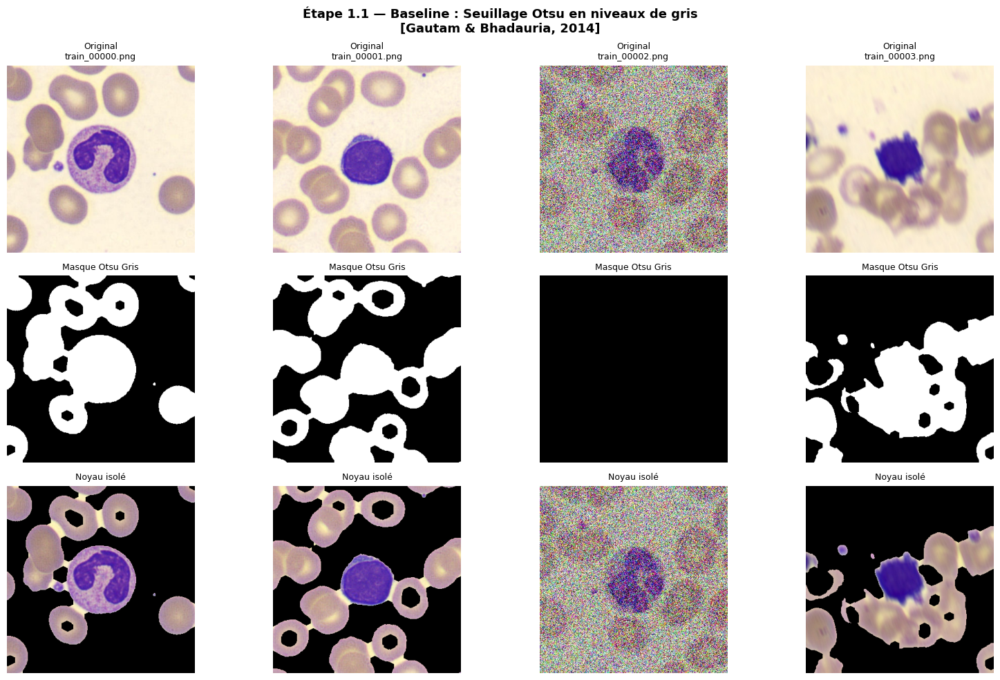

DIAGNOSTIC DES LIMITES DE L'APPROCHE NAIVE
  train_00000.png: bruit=47.6, seuil=193, couverture masque=37.3%  ⚠️ IMAGE BRUITÉE
  train_00001.png: bruit=43.3, seuil=198, couverture masque=43.3%  ⚠️ IMAGE BRUITÉE
  train_00002.png: bruit=67.9, seuil=135, couverture masque=100.0%  ⚠️ IMAGE BRUITÉE
  train_00003.png: bruit=45.6, seuil=190, couverture masque=34.3%  ⚠️ IMAGE BRUITÉE


Corrupt JPEG data: 27 extraneous bytes before marker 0xdb


In [ ]:
# ============================================================
# ÉTAPE 1.1 — BASELINE : Seuillage d'Otsu en niveaux de gris
# ============================================================
# Méthode de référence historique utilisée par Gautam & Bhadauria (2014).
# Conversion RGB → Gris → Seuillage Otsu → Morphologie minimale.
#
# Limites connues :
#   - Ne distingue pas le noyau violet des globules rouges (pas d'info couleur)
#   - Échoue sur les images bruitées (variance élevée → mauvais seuil)
#   - Reconnu par Gautam & Bhadauria (2014) eux-mêmes
# ============================================================

def segment_otsu_gray(img_bgr):
    """Segmentation naïve par seuillage Otsu en niveaux de gris."""
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # Seuillage d'Otsu (minimise la variance intra-classe)
    thresh = threshold_otsu(img_gray)
    mask = (img_gray < thresh).astype(np.uint8) * 255  # objets sombres = noyau
    
    # Morphologie minimale pour boucher les trous
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)
    
    nucleus = cv2.bitwise_and(img_bgr, img_bgr, mask=mask)
    return mask, nucleus


# --- Visualisation sur 4 images ---
sample_ids = train_df[id_col].values[:4]
fig, axes = plt.subplots(3, 4, figsize=(16, 10))

for i, sid in enumerate(sample_ids):
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    mask, nucleus = segment_otsu_gray(img)
    
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Original\n{sid}", fontsize=9)
    axes[0, i].axis('off')
    
    axes[1, i].imshow(mask, cmap='gray')
    axes[1, i].set_title("Masque Otsu Gris", fontsize=9)
    axes[1, i].axis('off')
    
    axes[2, i].imshow(cv2.cvtColor(nucleus, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title("Noyau isolé", fontsize=9)
    axes[2, i].axis('off')

plt.suptitle("Étape 1.1 — Baseline : Seuillage Otsu en niveaux de gris\n"
             "[Gautam & Bhadauria, 2014]", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

# --- Diagnostic des limites ---
print("=" * 60)
print("DIAGNOSTIC DES LIMITES DE L'APPROCHE NAIVE")
print("=" * 60)
for sid in sample_ids[:4]:
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    noise = np.std(gray)
    thresh = threshold_otsu(gray)
    mask, _ = segment_otsu_gray(img)
    coverage = np.sum(mask > 0) / mask.size * 100
    print(f"  {sid}: bruit={noise:.1f}, seuil={thresh:.0f}, "
          f"couverture masque={coverage:.1f}%"
          f"  {'⚠️ IMAGE BRUITÉE' if noise > 40 else '✅'}")

Corrupt JPEG data: 27 extraneous bytes before marker 0xdb


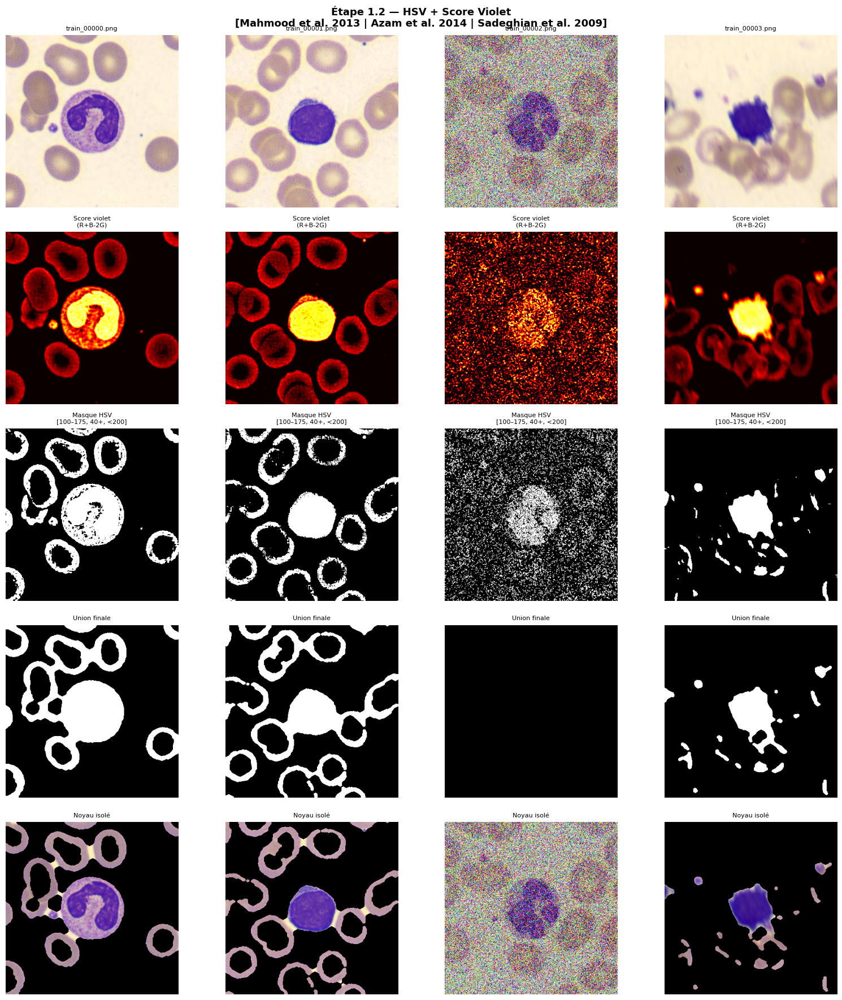

In [18]:
# ============================================================
# ÉTAPE 1.2 — ESPACE HSV + SCORE VIOLET
# ============================================================
# Motivé par :
#   - Mahmood et al. (2013) : la segmentation couleur (CIELAB) améliore
#     la détection des WBC vs le seuillage en gris
#   - Azam et al. (2014) : filtrage et labellisation dans l'espace couleur
#   - Sadeghian et al. (2009) : framework HSV pour surmonter les limites du gris
#   - Al-Dulaimi et al. (2018) : l'HSV sépare chrominance/luminance,
#     le rendant robuste aux variations d'illumination
#
# purple_score = R + B - 2G
#   → Les noyaux colorés au Giemsa/Wright absorbent le vert (G bas)
#     et réfléchissent le rouge et le bleu → score élevé
# ============================================================

def segment_hsv_purple(img_bgr):
    """Segmentation HSV + score violet pour images nettes."""
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(img_hsv)
    
    r = img_bgr[:, :, 2].astype(np.float32)
    g = img_bgr[:, :, 1].astype(np.float32)
    b = img_bgr[:, :, 0].astype(np.float32)
    
    # Score violet : les noyaux Giemsa absorbent le vert
    purple_score_map = (r + b - 2 * g).clip(0, 255).astype(np.uint8)
    
    # Masque HSV : teintes violettes/pourpres (Hue ∈ [100, 175])
    lower_purple = np.array([100, 40, 30])
    upper_purple = np.array([175, 255, 200])
    mask_hsv = cv2.inRange(img_hsv, lower_purple, upper_purple)
    
    # Seuillage Otsu sur le score violet, en excluant le fond blanc (V < 210)
    mask_not_white = (v < 210).astype(np.uint8) * 255
    thresh_val = threshold_otsu(purple_score_map)
    _, mask_purple = cv2.threshold(purple_score_map, thresh_val, 255, cv2.THRESH_BINARY)
    mask_purple = cv2.bitwise_and(mask_purple, mask_not_white)
    
    # Union des deux masques
    mask = cv2.bitwise_or(mask_hsv, mask_purple)
    
    # Morphologie pour nettoyer
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=3)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    nucleus = cv2.bitwise_and(img_bgr, img_bgr, mask=mask)
    return mask, nucleus, purple_score_map, mask_hsv, mask_purple


# --- Visualisation comparative HSV vs Gris ---
fig, axes = plt.subplots(5, 4, figsize=(16, 18))
row_labels = ["Original", "Score Violet", "Masque HSV",
              "Union HSV+Violet", "Noyau isolé"]

for i, sid in enumerate(sample_ids):
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    mask, nucleus, ps_map, mask_h, mask_p = segment_hsv_purple(img)
    
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"{sid}", fontsize=8)
    
    axes[1, i].imshow(ps_map, cmap='hot')
    axes[1, i].set_title(f"Score violet\n(R+B-2G)", fontsize=8)
    
    axes[2, i].imshow(mask_h, cmap='gray')
    axes[2, i].set_title("Masque HSV\n[100–175, 40+, <200]", fontsize=8)
    
    axes[3, i].imshow(mask, cmap='gray')
    axes[3, i].set_title("Union finale", fontsize=8)
    
    axes[4, i].imshow(cv2.cvtColor(nucleus, cv2.COLOR_BGR2RGB))
    axes[4, i].set_title("Noyau isolé", fontsize=8)
    
    for ax in axes[:, i]:
        ax.axis('off')

for ax, lbl in zip(axes[:, 0], row_labels):
    ax.set_ylabel(lbl, fontsize=9, fontweight='bold', rotation=90, labelpad=10)

plt.suptitle("Étape 1.2 — HSV + Score Violet\n"
             "[Mahmood et al. 2013 | Azam et al. 2014 | Sadeghian et al. 2009]",
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
/var/folders/km/j63n_dw918x451991gcszxl80000gn/T/ipykernel_4262/2399702287.py:92: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  plt.tight_layout()


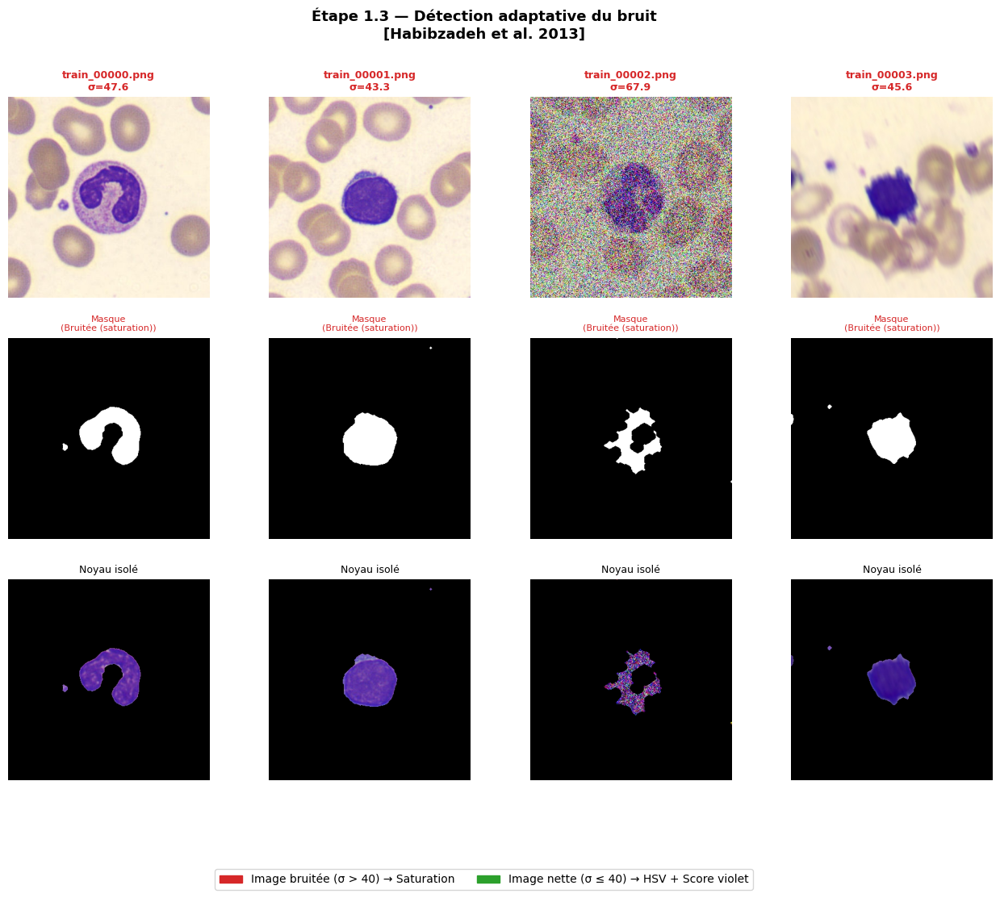

In [9]:
# ============================================================
# ÉTAPE 1.3 — DÉTECTION ADAPTATIVE DU BRUIT
# ============================================================
# Habibzadeh et al. (2013) : les erreurs de classification proviennent
# souvent de la mauvaise qualité des images (bruit, faible résolution).
#
# Stratégie :
#   - Si std(gris) > 40 → image bruitée → segmentation par saturation seule
#     (les noyaux restent très saturés même dans le bruit)
#     avec morphologie agressive (ouvertures/fermetures larges)
#   - Sinon → pipeline HSV + score violet (Étape 1.2)
# ============================================================

def segment_adaptive_noise(img_bgr):
    """Pipeline adaptatif selon le niveau de bruit de l'image."""
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, s, v = cv2.split(img_hsv)
    
    r = img_bgr[:, :, 2].astype(np.float32)
    g = img_bgr[:, :, 1].astype(np.float32)
    b = img_bgr[:, :, 0].astype(np.float32)
    purple_score_map = (r + b - 2 * g).clip(0, 255).astype(np.uint8)
    
    noise_level = np.std(img_gray)
    is_noisy = noise_level > 40
    
    if is_noisy:
        # --- Branche BRUITÉE : saturation + morphologie agressive ---
        thresh_s = threshold_otsu(s)
        _, mask = cv2.threshold(s, thresh_s, 255, cv2.THRESH_BINARY)
        
        kernel_small = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel_small, iterations=2)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=3)
        branch = "Bruitée (saturation)"
    else:
        # --- Branche NETTE : HSV + score violet ---
        lower_purple = np.array([100, 40, 30])
        upper_purple = np.array([175, 255, 200])
        mask_hsv = cv2.inRange(img_hsv, lower_purple, upper_purple)
        
        mask_not_white = (v < 210).astype(np.uint8) * 255
        thresh_val = threshold_otsu(purple_score_map)
        _, mask_purple = cv2.threshold(purple_score_map, thresh_val, 255, cv2.THRESH_BINARY)
        mask_purple = cv2.bitwise_and(mask_purple, mask_not_white)
        mask = cv2.bitwise_or(mask_hsv, mask_purple)
        
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=3)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
        branch = "Nette (HSV+violet)"
    
    nucleus = cv2.bitwise_and(img_bgr, img_bgr, mask=mask)
    return mask, nucleus, noise_level, is_noisy, branch


# --- Visualisation avec indicateur de branche ---
fig, axes = plt.subplots(3, 4, figsize=(16, 11))

for i, sid in enumerate(sample_ids):
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    mask, nucleus, noise, noisy, branch = segment_adaptive_noise(img)
    
    color = "#d62728" if noisy else "#2ca02c"
    
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"{sid}\nσ={noise:.1f}", fontsize=9,
                          color=color, fontweight='bold')
    axes[0, i].axis('off')
    
    axes[1, i].imshow(mask, cmap='gray')
    axes[1, i].set_title(f"Masque\n({branch})", fontsize=8, color=color)
    axes[1, i].axis('off')
    
    axes[2, i].imshow(cv2.cvtColor(nucleus, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title("Noyau isolé", fontsize=9)
    axes[2, i].axis('off')

noisy_patch = mpatches.Patch(color='#d62728', label='Image bruitée (σ > 40) → Saturation')
clean_patch = mpatches.Patch(color='#2ca02c', label='Image nette (σ ≤ 40) → HSV + Score violet')
plt.legend(handles=[noisy_patch, clean_patch], loc='lower center',
           bbox_to_anchor=(0.5, -0.02), ncol=2, fontsize=10,
           bbox_transform=fig.transFigure)

plt.suptitle("Étape 1.3 — Détection adaptative du bruit\n"
             "[Habibzadeh et al. 2013]", fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

Corrupt JPEG data: 27 extraneous bytes before marker 0xdb


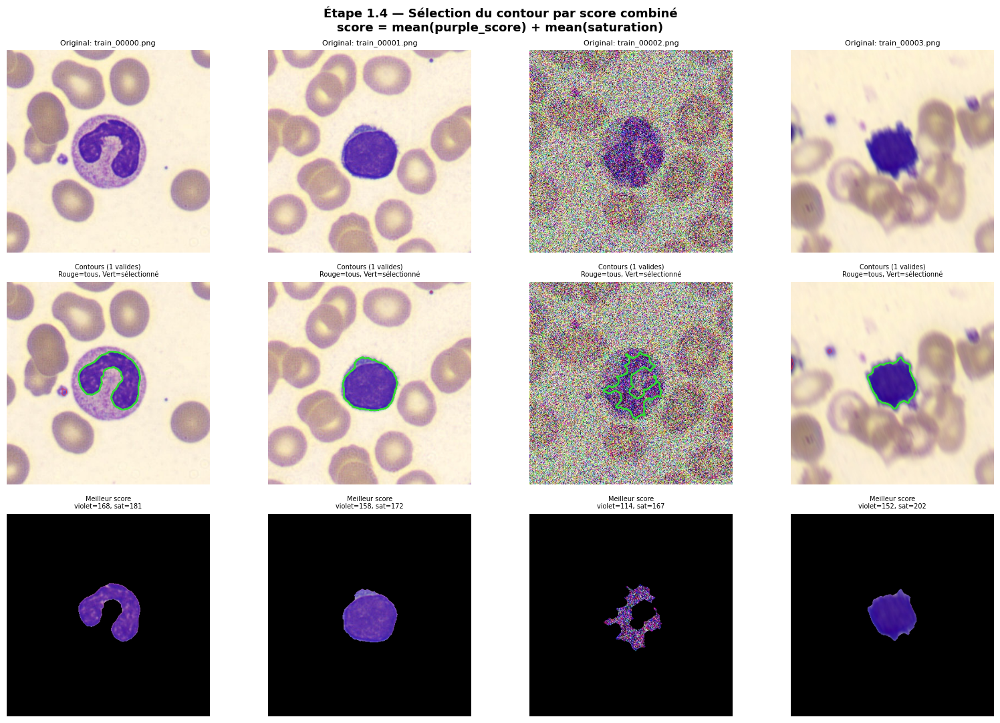

In [10]:
# ============================================================
# ÉTAPE 1.4 — SÉLECTION DU MEILLEUR CONTOUR PAR SCORE COMBINÉ
# ============================================================
# Problème : le masque peut contenir plusieurs composantes connexes
# (débris, plaquettes, chevauchements de cellules).
#
# Critère de sélection :
#   score = mean(purple_score) + mean(saturation)  sur les pixels du contour
#   → Choisir le contour le plus "violet" plutôt que le plus grand
#   → Garantit la sélection du noyau et non d'un artefact géométrique
# ============================================================

def select_best_contour(mask, img_bgr, img_gray, purple_score_map, s_channel):
    """Sélectionne le contour avec le score violet+saturation le plus élevé."""
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    stats = []  # pour visualisation
    best_contour = None
    best_score = -1
    
    for cnt in contours:
        area_cnt = cv2.contourArea(cnt)
        if area_cnt < 200:
            continue
        
        tmp_mask = np.zeros_like(img_gray)
        cv2.drawContours(tmp_mask, [cnt], -1, 255, -1)
        
        mean_purple = np.mean(purple_score_map[tmp_mask > 0])
        mean_sat = np.mean(s_channel[tmp_mask > 0])
        combined = mean_purple + mean_sat
        
        stats.append({
            'area': area_cnt,
            'mean_purple': mean_purple,
            'mean_sat': mean_sat,
            'combined': combined
        })
        
        if combined > best_score:
            best_score = combined
            best_contour = cnt
    
    if best_contour is not None:
        mask_out = np.zeros_like(mask)
        cv2.drawContours(mask_out, [best_contour], -1, 255, -1)
    else:
        thresh = threshold_otsu(img_gray)
        _, mask_out = cv2.threshold(img_gray, thresh, 255, cv2.THRESH_BINARY_INV)
    
    return mask_out, contours, best_contour, stats


def segment_with_contour_selection(img_bgr):
    """Pipeline adaptatif + sélection du meilleur contour."""
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, s, v = cv2.split(img_hsv)
    
    r = img_bgr[:, :, 2].astype(np.float32)
    g = img_bgr[:, :, 1].astype(np.float32)
    b = img_bgr[:, :, 0].astype(np.float32)
    purple_score_map = (r + b - 2 * g).clip(0, 255).astype(np.uint8)
    
    noise_level = np.std(img_gray)
    is_noisy = noise_level > 40
    
    if is_noisy:
        thresh_s = threshold_otsu(s)
        _, mask = cv2.threshold(s, thresh_s, 255, cv2.THRESH_BINARY)
        k_s = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k_s, iterations=2)
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k, iterations=3)
    else:
        lower_purple = np.array([100, 40, 30])
        upper_purple = np.array([175, 255, 200])
        mask_hsv = cv2.inRange(img_hsv, lower_purple, upper_purple)
        mask_not_white = (v < 210).astype(np.uint8) * 255
        thresh_val = threshold_otsu(purple_score_map)
        _, mask_purple = cv2.threshold(purple_score_map, thresh_val, 255, cv2.THRESH_BINARY)
        mask_purple = cv2.bitwise_and(mask_purple, mask_not_white)
        mask = cv2.bitwise_or(mask_hsv, mask_purple)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=3)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    mask_final, all_contours, best_cnt, stats = select_best_contour(
        mask, img_bgr, img_gray, purple_score_map, s)
    
    nucleus = cv2.bitwise_and(img_bgr, img_bgr, mask=mask_final)
    return mask, mask_final, nucleus, all_contours, best_cnt, stats


# --- Visualisation : tous les contours vs contour sélectionné ---
fig, axes = plt.subplots(3, 4, figsize=(16, 11))

for i, sid in enumerate(sample_ids):
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    mask_raw, mask_sel, nucleus, all_cnts, best_cnt, stats = segment_with_contour_selection(img)
    
    # Dessin de tous les contours (rouge) et du meilleur (vert)
    img_contours = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).copy()
    cv2.drawContours(img_contours, all_cnts, -1, (255, 50, 50), 1)
    if best_cnt is not None:
        cv2.drawContours(img_contours, [best_cnt], -1, (50, 220, 50), 2)
    
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Original: {sid}", fontsize=8)
    axes[0, i].axis('off')
    
    axes[1, i].imshow(img_contours)
    n_valid = len([s for s in stats if s['area'] >= 200])
    axes[1, i].set_title(f"Contours ({n_valid} valides)\nRouge=tous, Vert=sélectionné",
                          fontsize=7)
    axes[1, i].axis('off')
    
    axes[2, i].imshow(cv2.cvtColor(nucleus, cv2.COLOR_BGR2RGB))
    if stats:
        best_s = max(stats, key=lambda x: x['combined'])
        axes[2, i].set_title(
            f"Meilleur score\nviolet={best_s['mean_purple']:.0f}, "
            f"sat={best_s['mean_sat']:.0f}", fontsize=7)
    axes[2, i].axis('off')

plt.suptitle("Étape 1.4 — Sélection du contour par score combiné\n"
             "score = mean(purple_score) + mean(saturation)",
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

Corrupt JPEG data: 27 extraneous bytes before marker 0xdb
/var/folders/km/j63n_dw918x451991gcszxl80000gn/T/ipykernel_4262/1567565805.py:152: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/agshayn/Desktop/cours/2A/IMA/4IM05/projet_kaggle/wbc-classification/venv/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128308 (\N{LARGE RED CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


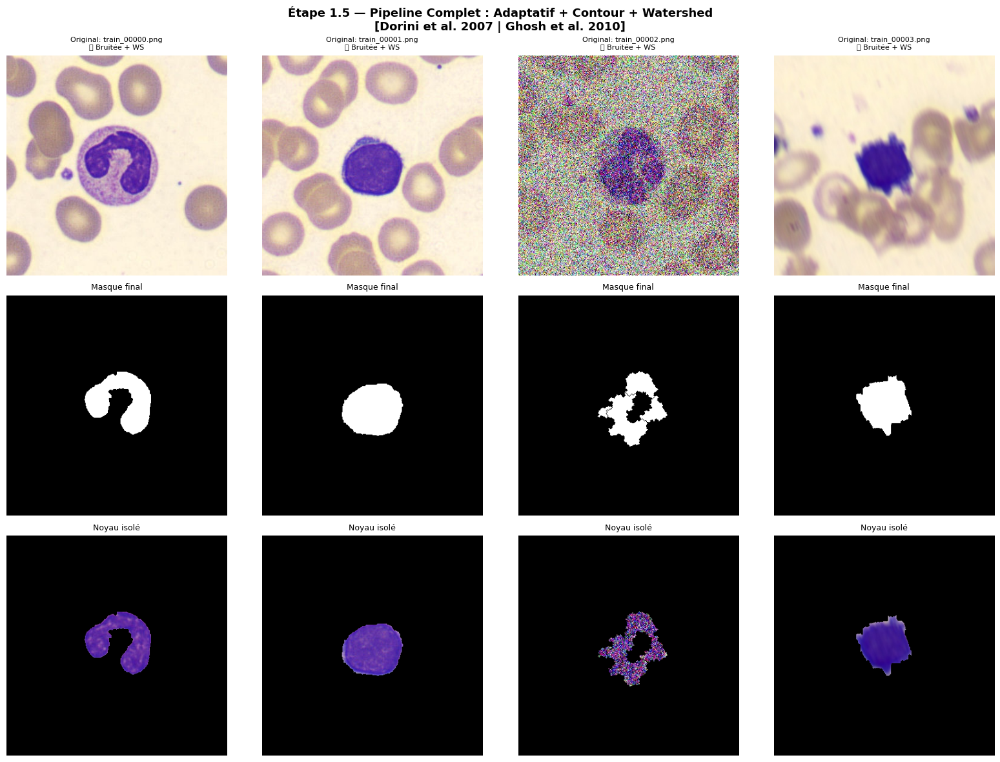


✅ Pipeline de segmentation complet — Résumé des étapes :
  1.1 Baseline Otsu gris       → limite : pas d'info couleur
  1.2 HSV + Score violet       → exploite la chrominance Giemsa
  1.3 Adaptatif bruit (σ>40)   → saturation si image bruitée
  1.4 Sélection par score      → mean_purple + mean_saturation
  1.5 Watershed conditionnel   → séparation des lobes (neutrophiles)


In [11]:
# ============================================================
# ÉTAPE 1.5 — RAFFINEMENT PAR WATERSHED CONDITIONNEL
# ============================================================
# Motivation :
#   - Les neutrophiles (≈62% des WBC) ont des noyaux multilobés
#     → le masque HSV peut fusionner les lobes en un seul blob
#   - Dorini et al. (2007) et Ghosh et al. (2010) : watershed contrôlé
#     par marqueurs = efficace pour la séparation des structures nucléaires
#
# Stratégie conditionnelle :
#   1. Distance transform sur le masque → markers "sure foreground"
#   2. Watershed → sépare les lobes
#   3. Si résultat aberrant (< 30% du masque initial) → on garde le masque brut
# ============================================================

def apply_watershed(mask, img_bgr):
    """Watershed conditionnel avec vérification de cohérence."""
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
    area = np.sum(mask > 0)
    
    if area <= 500:
        return mask, False  # pas assez de matière pour le watershed
    
    # --- Distance transform → marqueurs ---
    dist_transform = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
    _, sure_fg = cv2.threshold(dist_transform, 0.4 * dist_transform.max(), 255, 0)
    sure_fg = np.uint8(sure_fg)
    
    sure_bg = cv2.dilate(mask, kernel, iterations=3)
    unknown = cv2.subtract(sure_bg, sure_fg)
    
    _, markers = cv2.connectedComponents(sure_fg)
    markers = markers + 1
    markers[unknown == 255] = 0
    
    markers_ws = cv2.watershed(img_bgr, markers)
    
    mask_ws = np.zeros_like(img_gray)
    mask_ws[markers_ws > 1] = 255
    
    # Vérification : le résultat watershed est-il cohérent ?
    if np.sum(mask_ws > 0) < area * 0.3:
        return mask, False  # watershed aberrant → fallback
    
    return mask_ws, True


def segment_wbc_full(img_bgr):
    """
    Pipeline complet de segmentation WBC :
    Otsu Adaptatif → HSV+Violet → Sélection contour → Watershed
    """
    img_hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    h, s, v = cv2.split(img_hsv)
    
    r = img_bgr[:, :, 2].astype(np.float32)
    g = img_bgr[:, :, 1].astype(np.float32)
    b = img_bgr[:, :, 0].astype(np.float32)
    purple_score_map = (r + b - 2 * g).clip(0, 255).astype(np.uint8)
    
    # --- Étape 1.3 : détection du bruit ---
    noise_level = np.std(img_gray)
    is_noisy = noise_level > 40
    
    if is_noisy:
        thresh_s = threshold_otsu(s)
        _, mask = cv2.threshold(s, thresh_s, 255, cv2.THRESH_BINARY)
        k_s = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, k_s, iterations=2)
        k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, k, iterations=3)
    else:
        lower_purple = np.array([100, 40, 30])
        upper_purple = np.array([175, 255, 200])
        mask_hsv = cv2.inRange(img_hsv, lower_purple, upper_purple)
        mask_not_white = (v < 210).astype(np.uint8) * 255
        thresh_val = threshold_otsu(purple_score_map)
        _, mask_purple = cv2.threshold(purple_score_map, thresh_val, 255, cv2.THRESH_BINARY)
        mask_purple = cv2.bitwise_and(mask_purple, mask_not_white)
        mask = cv2.bitwise_or(mask_hsv, mask_purple)
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
        mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=3)
        mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=1)
    
    # --- Étape 1.4 : sélection du meilleur contour ---
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        best_contour = None
        best_score = -1
        for cnt in contours:
            area_cnt = cv2.contourArea(cnt)
            if area_cnt < 200:
                continue
            tmp_mask = np.zeros_like(img_gray)
            cv2.drawContours(tmp_mask, [cnt], -1, 255, -1)
            mean_purple = np.mean(purple_score_map[tmp_mask > 0])
            mean_sat = np.mean(s[tmp_mask > 0])
            combined_score = mean_purple + mean_sat
            if combined_score > best_score:
                best_score = combined_score
                best_contour = cnt
        
        if best_contour is not None:
            mask_filled = np.zeros_like(mask)
            cv2.drawContours(mask_filled, [best_contour], -1, 255, -1)
            mask = mask_filled
        else:
            _, mask = cv2.threshold(img_gray, threshold_otsu(img_gray), 255, cv2.THRESH_BINARY_INV)
    else:
        _, mask = cv2.threshold(img_gray, threshold_otsu(img_gray), 255, cv2.THRESH_BINARY_INV)
    
    # --- Étape 1.5 : watershed conditionnel ---
    mask_final, ws_applied = apply_watershed(mask, img_bgr)
    
    nucleus_region = cv2.bitwise_and(img_bgr, img_bgr, mask=mask_final)
    return mask_final, nucleus_region, is_noisy, ws_applied


# ============================================================
# VISUALISATION FINALE — Pipeline complet
# ============================================================
fig, axes = plt.subplots(3, 4, figsize=(16, 12))

for i, sid in enumerate(sample_ids):
    img_path = os.path.join(TRAIN_DIR, str(sid))
    if not os.path.exists(img_path):
        continue
    img = load_image(img_path)
    mask, nucleus, is_noisy, ws_used = segment_wbc_full(img)
    
    tag = ("🔴 Bruitée" if is_noisy else "🟢 Nette") + \
          (" + WS" if ws_used else "")
    
    axes[0, i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Original: {sid}\n{tag}", fontsize=8)
    axes[0, i].axis('off')
    
    axes[1, i].imshow(mask, cmap='gray')
    axes[1, i].set_title("Masque final", fontsize=9)
    axes[1, i].axis('off')
    
    axes[2, i].imshow(cv2.cvtColor(nucleus, cv2.COLOR_BGR2RGB))
    axes[2, i].set_title("Noyau isolé", fontsize=9)
    axes[2, i].axis('off')

plt.suptitle(
    "Étape 1.5 — Pipeline Complet : Adaptatif + Contour + Watershed\n"
    "[Dorini et al. 2007 | Ghosh et al. 2010]",
    fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✅ Pipeline de segmentation complet — Résumé des étapes :")
print("  1.1 Baseline Otsu gris       → limite : pas d'info couleur")
print("  1.2 HSV + Score violet       → exploite la chrominance Giemsa")
print("  1.3 Adaptatif bruit (σ>40)   → saturation si image bruitée")
print("  1.4 Sélection par score      → mean_purple + mean_saturation")
print("  1.5 Watershed conditionnel   → séparation des lobes (neutrophiles)")